1. В коде из методички реализуйте один или несколько из критериев останова (количество листьев, количество используемых признаков, глубина дерева и т.д.).
2. Для задачи классификации обучить дерево решений с использованием критериев разбиения Джини и Энтропия. Сравнить качество классификации, сделать выводы.
3. (опция). Реализуйте дерево для задачи регрессии. Возьмите за основу дерево, реализованное в методичке, заменив механизм предсказания в листе на взятие среднего значения по выборке, и критерий Джини на дисперсию значений.

In [1]:
import matplotlib.pyplot as plt
import random
from copy import deepcopy
from matplotlib.colors import ListedColormap
from sklearn import datasets

import numpy as np

In [2]:
# сгенерируем данные
classification_data, classification_labels = datasets.make_classification(n_samples=200, n_features = 2, n_informative = 2, 
                                                      n_classes = 2, n_redundant=0, 
                                                      n_clusters_per_class=1, random_state=6, flip_y=0.15)

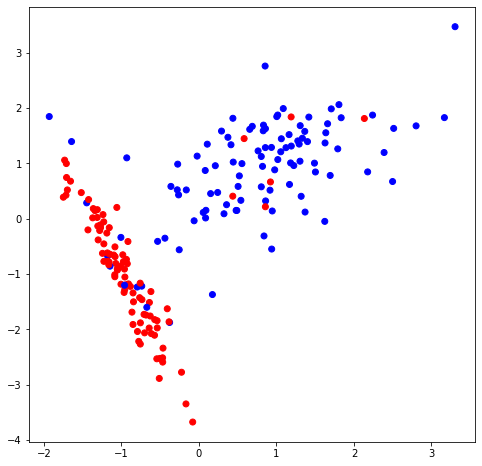

In [3]:
# визуализируем сгенерированные данные

colors = ListedColormap(['red', 'blue'])
light_colors = ListedColormap(['lightcoral', 'lightblue'])

plt.figure(figsize=(8,8))
plt.scatter(list(map(lambda x: x[0], classification_data)), list(map(lambda x: x[1], classification_data)), 
              c=classification_labels, cmap=colors)

In [4]:
# Реализуем класс узла

class Node:
    
    def __init__(self, index, t, true_branch, false_branch):
        self.index = index  # индекс признака, по которому ведется сравнение с порогом в этом узле
        self.t = t  # значение порога
        self.true_branch = true_branch  # поддерево, удовлетворяющее условию в узле
        self.false_branch = false_branch  # поддерево, не удовлетворяющее условию в узле

In [5]:
# И класс терминального узла (листа)

class Leaf:
    
    def __init__(self, data, labels):
        self.data = data
        self.labels = labels
        self.prediction = self.predict()
        
    def predict(self):
        # подсчет количества объектов разных классов
        classes = {}  # сформируем словарь "класс: количество объектов"
        for label in self.labels:
            if label not in classes:
                classes[label] = 0
            classes[label] += 1
        #  найдем класс, количество объектов которого будет максимальным в этом листе и вернем его    
        prediction = max(classes, key=classes.get)
        return prediction        

In [6]:
# Расчет критерия Джини

def gini(labels):
    #  подсчет количества объектов разных классов
    classes = {}
    for label in labels:
        if label not in classes:
            classes[label] = 0
        classes[label] += 1
    
    #  расчет критерия
    impurity = 1
    for label in classes:
        p = classes[label] / len(labels)
        impurity -= p ** 2
        
    return impurity

In [7]:
# Расчет критерия энтропии Шеннона
def shannon_entropy(labels):
    unique = np.array(np.unique(labels, return_counts=True))
    length = labels.shape[0]
    pks = unique[1]/length
    se = - np.sum(pks *np.log2 (pks)) 
    return se 

In [8]:
# Расчет качества

def quality(left_labels, right_labels, current_criterion, criterion):

    # доля выбоки, ушедшая в левое поддерево
    p = float(left_labels.shape[0]) / (left_labels.shape[0] + right_labels.shape[0])
    
    return current_criterion - p * criterion(left_labels) - (1 - p) * criterion(right_labels)

In [9]:
# Разбиение датасета в узле

def split(data, labels, index, t):
    
    left = np.where(data[:, index] <= t)
    right = np.where(data[:, index] > t)
        
    true_data = data[left]
    false_data = data[right]
    true_labels = labels[left]
    false_labels = labels[right]
        
    return true_data, false_data, true_labels, false_labels

In [10]:
# Нахождение наилучшего разбиения

def find_best_split(data, labels, stop_factor, criterion):
    
    #  обозначим минимальное количество объектов в узле
    if stop_factor.get('leaf_size'):
        min_leaf = stop_factor['leaf_size']

    current_criterion = criterion(labels)

    best_quality = 0
    best_t = None
    best_index = None
    
    n_features = data.shape[1]
    
    for index in range(n_features):
        # будем проверять только уникальные значения признака, исключая повторения
        t_values = np.unique([row[index] for row in data])
        
        for t in t_values:
            true_data, false_data, true_labels, false_labels = split(data, labels, index, t)
            #  пропускаем разбиения, в которых в узле остается менее leaf_size объектов
            if stop_factor.get('leaf_size'):
                if len(true_data) < min_leaf or len(false_data) < min_leaf:
                    continue
            
            current_quality = quality(true_labels, false_labels, current_criterion, criterion)
            
            #  выбираем порог, на котором получается максимальный прирост качества
            if current_quality > best_quality:
                best_quality, best_t, best_index = current_quality, t, index

    return best_quality, best_t, best_index

In [11]:
# Построение дерева с помощью рекурсивной функции

def build_tree(data, labels, stop_factor={'leaf_size': 5}, criterion=gini):
    '''
    stop factor:
    Dict {factor_name: factor_parametr}. Can be used several in same time.
    for example: {'tree_depth': 3, 'leaf_size': 2, 'min_quality': 0.02}
    1. leaf_size          (default=5)
    2. tree_depth
    3. unique  (always on)
    4. min_quality        [0,1]

    criterion:
    for ecample: criterion=gini
    1. gini               (default=5)
    2. shannon_entropy
    '''

    # останов в случае, когда все объекты в листе относятся к одному классу
    if np.unique(labels).shape[0] == 1:
        return Leaf(data, labels)

    # останов по глубине дерева
    if "tree_depth" in stop_factor:
        if stop_factor['tree_depth'] == 0:
            return Leaf(data, labels)
        else:
            stop_factor['tree_depth'] -= 1
    
    quality, t, index = find_best_split(data, labels, stop_factor, criterion)

    #  Базовый случай - прекращаем рекурсию, когда нет прироста в качества
    if not stop_factor.get('min_quality'):
        stop_factor['min_quality'] = 0

    if quality <= stop_factor['min_quality']:
        return Leaf(data, labels)
        
    true_data, false_data, true_labels, false_labels = split(data, labels, index, t)

    # Рекурсивно строим два поддерева
    true_branch = build_tree(true_data, true_labels, deepcopy(stop_factor), criterion)
    false_branch = build_tree(false_data, false_labels, deepcopy(stop_factor), criterion)

    # Возвращаем класс узла со всеми поддеревьями, то есть целого дерева
    return Node(index, t, true_branch, false_branch)

In [12]:
def predict(data, tree):
    
    classes = []
    for obj in data:
        prediction = classify_object(obj, tree)
        classes.append(prediction)
    return classes

In [13]:
def classify_object(obj, node):

    #  Останавливаем рекурсию, если достигли листа
    if isinstance(node, Leaf):
        answer = node.prediction
        return answer

    if obj[node.index] <= node.t:
        return classify_object(obj, node.true_branch)
    else:
        return classify_object(obj, node.false_branch)

In [14]:
# Разобьем выборку на обучающую и тестовую

from sklearn import model_selection

train_data, test_data, train_labels, test_labels = model_selection.train_test_split(classification_data, 
                                                                                     classification_labels, 
                                                                                     test_size = 0.3,
                                                                                     random_state = 1)

Я не стал реальизовывать останов на минимальное количесво листов, по причине того, что он весьма странен для рекурентной функции. Вначале мы пойдем по пути true_branch, и когда вней наступит условие числа листов, другая часть дерева оформится в листы. Вряд ли это будет является хорошим разбиением. Во-первых листов будет больше чем мы заказывали, во-вторых дерево может получитсья перекошеным. Либо если брать его как степень 2 ** глубина, то это тоже имеет не много смысла, так как всеравно будем работать с глубиной, а не с количеством листьев.

In [15]:
# Построим дерево по обучающей выборке
# stop_factor = {'leaf_size': 6}
# stop_factor = {'min_quality': 0.1}
stop_factor = {'tree_depth': 8}
# stop_factor = {'tree_depth': 3, 'leaf_size': 2}
my_tree = build_tree(train_data, train_labels, stop_factor, criterion=gini)

In [16]:
# Напечатаем ход нашего дерева
def print_tree(node, spacing=""):

    # Если лист, то выводим его прогноз
    if isinstance(node, Leaf):
        print(spacing + "Прогноз:", node.prediction)
        return

    # Выведем значение индекса и порога на этом узле
    print(spacing + 'Индекс', str(node.index))
    print(spacing + 'Порог', str(node.t))

    # Рекурсионный вызов функции на положительном поддереве
    print (spacing + '--> True:')
    print_tree(node.true_branch, spacing + "  ")

    # Рекурсионный вызов функции на положительном поддереве
    print (spacing + '--> False:')
    print_tree(node.false_branch, spacing + "  ")
    
print_tree(my_tree)

Индекс 0
Порог -0.38627472533419693
--> True:
  Индекс 1
  Порог 1.0579877283696502
  --> True:
    Индекс 1
    Порог -1.6297670700127593
    --> True:
      Прогноз: 0
    --> False:
      Индекс 0
      Порог -0.844867873188232
      --> True:
        Индекс 1
        Порог -1.2038943360906313
        --> True:
          Индекс 0
          Порог -0.9600055189772271
          --> True:
            Прогноз: 1
          --> False:
            Прогноз: 0
        --> False:
          Индекс 0
          Порог -1.1818850236030947
          --> True:
            Индекс 0
            Порог -1.4488644218178455
            --> True:
              Индекс 0
              Порог -1.5187394289669363
              --> True:
                Прогноз: 0
              --> False:
                Прогноз: 1
            --> False:
              Прогноз: 0
          --> False:
            Индекс 0
            Порог -1.1788201967295513
            --> True:
              Прогноз: 1
            --> False:
   

In [17]:
# Получим ответы для обучающей выборки 
train_answers = predict(train_data, my_tree)

In [18]:
# И получим ответы для тестовой выборки
answers = predict(test_data, my_tree)

In [19]:
# Введем функцию подсчета точности как доли правильных ответов
def accuracy_metric(actual, predicted):
    correct = 0
    for i in range(len(actual)):
        if actual[i] == predicted[i]:
            correct += 1
    return correct / float(len(actual)) * 100.0

In [20]:
# Точность на обучающей выборке
train_accuracy = accuracy_metric(train_labels, train_answers)
train_accuracy

97.14285714285714

In [21]:
# Точность на тестовой выборке
test_accuracy = accuracy_metric(test_labels, answers)
test_accuracy

83.33333333333334

Text(0.5, 1.0, 'Test accuracy=83.33')

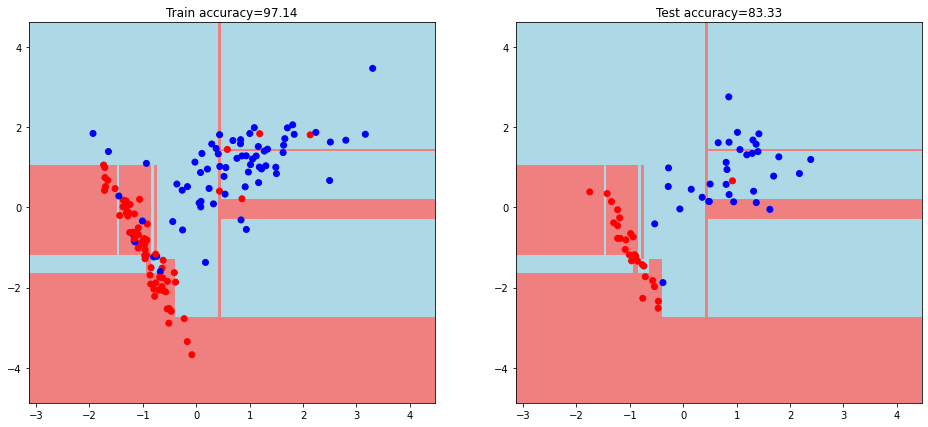

In [22]:
# Визуализируем дерево на графике

def get_meshgrid(data, step=.05, border=1.2):
    x_min, x_max = data[:, 0].min() - border, data[:, 0].max() + border
    y_min, y_max = data[:, 1].min() - border, data[:, 1].max() + border
    return np.meshgrid(np.arange(x_min, x_max, step), np.arange(y_min, y_max, step))

plt.figure(figsize = (16, 7))

# график обучающей выборки
plt.subplot(1,2,1)
xx, yy = get_meshgrid(train_data)
mesh_predictions = np.array(predict(np.c_[xx.ravel(), yy.ravel()], my_tree)).reshape(xx.shape)
plt.pcolormesh(xx, yy, mesh_predictions, cmap = light_colors)
plt.scatter(train_data[:, 0], train_data[:, 1], c = train_labels, cmap = colors)
plt.title(f'Train accuracy={train_accuracy:.2f}')

# график тестовой выборки
plt.subplot(1,2,2)
plt.pcolormesh(xx, yy, mesh_predictions, cmap = light_colors)
plt.scatter(test_data[:, 0], test_data[:, 1], c = test_labels, cmap = colors)
plt.title(f'Test accuracy={test_accuracy:.2f}')

при такой глубине 8 наблюдается явное переобучение.

In [23]:
def accuracy_different(stop_factor):
    gini_tree = build_tree(train_data, train_labels, deepcopy(stop_factor), criterion=gini)
    shannon_tree = build_tree(train_data, train_labels, deepcopy(stop_factor), criterion=shannon_entropy)

    gini_train_answers = predict(train_data, gini_tree)
    shannon_train_answers = predict(train_data, shannon_tree)

    gini_test_answers = predict(test_data, gini_tree)
    shannon_test_answers = predict(test_data, shannon_tree)

    gini_train_accuracy = accuracy_metric(train_labels, gini_train_answers)
    shannon_train_accuracy = accuracy_metric(train_labels, shannon_train_answers)

    gini_test_accuracy = accuracy_metric(test_labels, gini_test_answers)
    shannon_test_accuracy = accuracy_metric(test_labels, shannon_test_answers)

    print(
        f'tree_depth={i}\n'
        f'\t train \t test\n'
        f'gini \t{gini_train_accuracy:.2f}\t {gini_test_accuracy:.2f}\n'
        f'shannon\t{shannon_train_accuracy:.2f}\t{shannon_test_accuracy:.2f}\n\n')
for i in range(1,8):
    stop_factor = {'tree_depth': i}
    accuracy_different(stop_factor)


tree_depth=1
	 train 	 test
gini 	85.71	 96.67
shannon	85.71	96.67


tree_depth=2
	 train 	 test
gini 	90.00	 96.67
shannon	90.00	96.67


tree_depth=3
	 train 	 test
gini 	90.00	 96.67
shannon	90.00	96.67


tree_depth=4
	 train 	 test
gini 	91.43	 95.00
shannon	91.43	95.00


tree_depth=5
	 train 	 test
gini 	92.14	 98.33
shannon	91.43	95.00


tree_depth=6
	 train 	 test
gini 	94.29	 85.00
shannon	94.29	86.67


tree_depth=7
	 train 	 test
gini 	96.43	 83.33
shannon	95.71	85.00




В зависимости от глубины дерева, при разных ситуациях лучше себя ведут разные критерии. В общем выглядят примерно одинаково. При увиличении глубины дерева растет переобученность, на тестовой выборке, падает качесвто предсказаний.